## Load Libraries

In [1]:
import pandas as pd
import numpy as np
import torch
import os
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from starfysh import (AA, utils, plot_utils, post_analysis)
from starfysh import starfysh as sf_model

import warnings
warnings.filterwarnings('ignore')

## Load Data and Marker Genes

In [2]:
# Define file paths and identifiers for data analysis
data_path = 'C:/Users/fyl/OneDrive - Teesside University/Dissertation/Starfysh/Dataset'
sample_id = 'CID44971_TNBC'
sig_name = 'bc_signatures_version_1013.csv'

In [3]:
# Load expression counts
adata, adata_normed = utils.load_adata(data_folder=data_path,
                                       sample_id=sample_id, # sample id
                                       n_genes=2000  # number of highly variable genes to keep
                                       )

[2024-11-29 15:47:50] Preprocessing1: delete the mt and rp
[2024-11-29 15:47:51] Preprocessing2: Normalize
[2024-11-29 15:47:51] Preprocessing3: Logarithm
[2024-11-29 15:47:51] Preprocessing4: Find the variable genes


In [4]:
# Load  signature gene sets
gene_sig = pd.read_csv(os.path.join(data_path, sig_name))

# Filter signaature gene set to include only relevant genes present in the dataset
gene_sig = utils.filter_gene_sig(gene_sig, adata.to_df())

# View dataframe
gene_sig.head()

,Basal,LumA,LumB,MBC,Normal epithelial,Tcm,Tem,Tfh,Treg,Activated CD8,...,Plasmablasts,MDSC,Monocytes,cDC,pDC,CAFs MSC iCAF-like,CAFs myCAF-like,PVL differentiated,PVL immature,Endothelial
0,EMP1,SH3BGRL,UGCG,COL11A2,KRT14,CCR7,IL7R,CXCL13,TNFRSF4,CD69,...,IGKV3-15,ITGAM,LYZ,CD80,IL3RA,APOD,COL1A1,ACTA2,CCL19,ACKR1
1,TAGLN,HSPB1,ARMT1,SDC1,KRT17,LTB,ANXA1,NMB,LTB,CCR7,...,IGHG1,CD33,IL1B,CD86,LILRA4,DCN,COL1A2,TAGLN,RGS5,FABP4
2,TTYH1,PHGR1,ISOC1,FBN2,LTF,IL7R,CXCR4,NR3C1,IL32,CD27,...,IGKV1-5,ARG1,G0S2,CCR7,CD123,PTGDS,COL3A1,MYL9,IGFBP7,PLVAP
3,RTN4,SOX9,GDF15,MMP1,KRT15,SARAF,KLRB1,DUSP4,BATF,BTLA,...,IGKV3-20,NOS2,TYROBP,CD1A,TCF4,CFD,LUM,TPM2,NDUFA4L2,RAMP2
4,TK1,CEBPD,ZFP36,FABP5,PTN,SELL,TNFAIP3,TNFRSF18,FOXP3,CD40LG,...,IGKV3-11,CD68,FCN1,CD1C,IRF7,LUM,SFRP2,NDUFA4L2,CCL2,VWF


In [5]:
# View Anndata
adata

AnnData object with n_obs × n_vars = 1162 × 18954
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'features', 'highly_variable'

... storing 'sample' as categorical


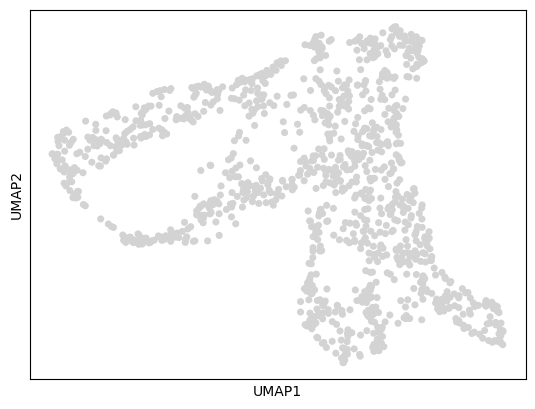

In [6]:
# Load spatial information (preprocess image)
img_metadata = utils.preprocess_img(
    data_path=data_path,
    sample_id=sample_id,
    adata_index=adata.obs.index,
    hchannel=False
)

# Extract the spatial information: image, map, and scale factor
img, map_info, scalefactor = img_metadata.get('img'), img_metadata.get('map_info'), img_metadata.get('scalefactor')

# Display UMAP (by calling the function directly)
umap_df = utils.get_umap(adata, display=True)

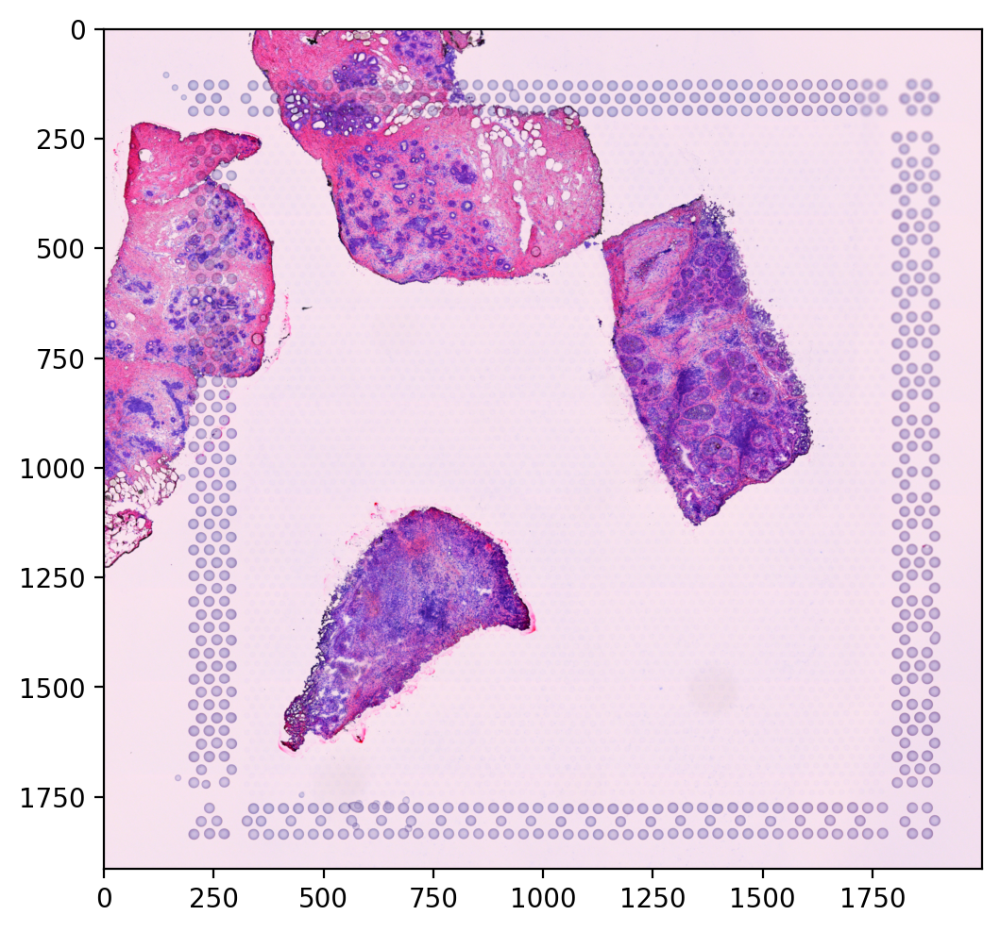

In [7]:
# Display tissue image
plt.figure(figsize=(6, 6), dpi=200)
plt.imshow(img)
plt.show()

In [8]:
# Preview map_info dataframe
map_info.head()

,array_row,array_col,imagerow,imagecol,sample
AACATTGGTCAGCCGT-1,3,17,1361,2511,CID44971_TNBC
CATCGAATGGATCTCT-1,3,19,1361,2620,CID44971_TNBC
CGGGTTGTAGCTTTGG-1,3,21,1361,2730,CID44971_TNBC
CCTAAGTGTCTAACCG-1,2,22,1266,2784,CID44971_TNBC
TCTGTGACTGACCGTT-1,3,23,1361,2839,CID44971_TNBC


In [9]:
# Parameters for training
visium_args = utils.VisiumArguments(adata,
                                    adata_normed,
                                    gene_sig,
                                    img_metadata,
                                    n_anchors=10,
                                    window_size=5,
                                    sample_id=sample_id
                                   )

adata, adata_normed = visium_args.get_adata()
anchors_df = visium_args.get_anchors()

[2024-11-29 15:48:08] Subsetting highly variable & signature genes ...
[2024-11-29 15:48:24] Smoothing library size by taking averaging with neighbor spots...
[2024-11-29 15:48:26] Retrieving & normalizing signature gene expressions...


       'HLA.DPB1'],
      dtype='object')
       'CH17-224D4.2', 'IGKV1-8', 'IGLV4-69', 'IGKV1-16', 'IGKV3D-11',
       'IGHV3-15'],
      dtype='object')
       'CD172A'],
      dtype='object')


[2024-11-29 15:48:36] Identifying anchor spots (highly expression of specific cell-type signatures)...


In [10]:
adata.shape

(1162, 2599)

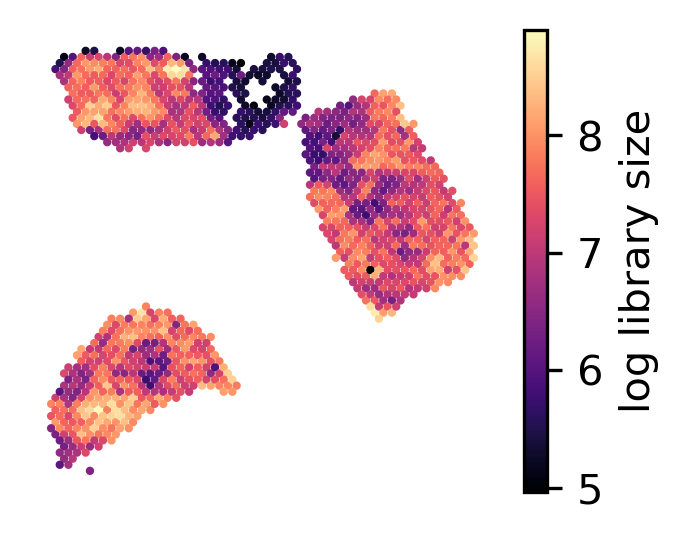

In [11]:
# Visualize spatial image
plot_utils.plot_spatial_feature(
    map_info,                 # Spatial information (map data)
    visium_args.log_lib,      # The variable (log library size) you want to plot
    label='log library size', # Label for the plot
    #vmin=None,                # Optional min value for scaling
    #vmax=None,                # Optional max value for scaling
    #figsize=(2.5, 2)          # Optional figsize
)

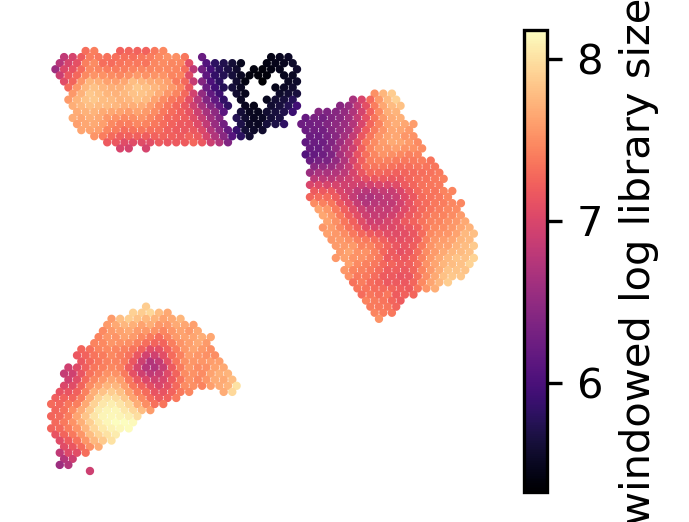

In [12]:
plot_utils.plot_spatial_feature(                                
                                map_info,
                                visium_args.win_loglib,
                                label='windowed log library size',
                                )

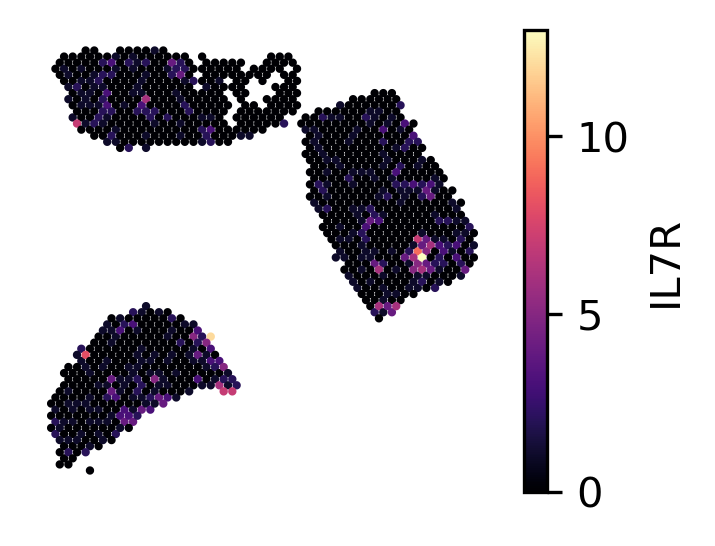

In [13]:
# Visualize spatial expression of a specific gene
plot_utils.plot_spatial_gene(adata, 
                             map_info,
                             gene_name='IL7R')

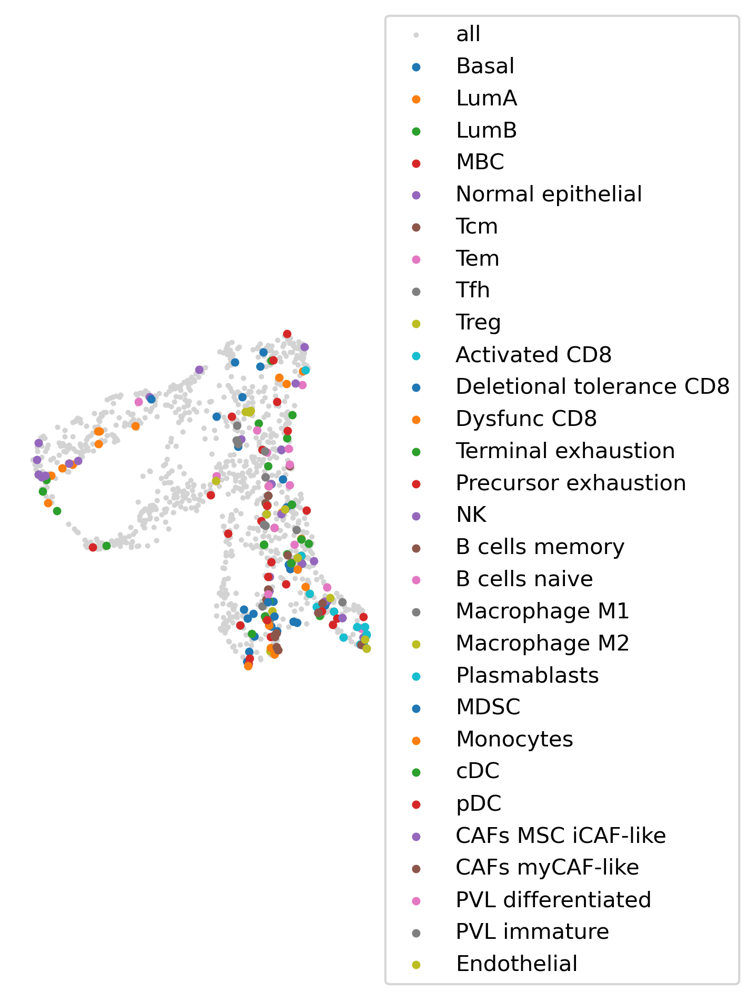

In [14]:
# Plotting Anchor Spots with UMAP and Signature mean analysis
plot_utils.plot_anchor_spots(umap_df,
                             visium_args.pure_spots,
                             visium_args.sig_mean,
                             bbox_x=2
                            )

## Run Starfysh

### Model Parameters

In [15]:
n_repeats = 3
epochs = 200
patience = 50
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Model Training

#### Base Starfysh deconvolution with ST expression matrix

In [16]:
# Run models
model, loss = utils.run_starfysh(visium_args,
                                 n_repeats=n_repeats,
                                 epochs=epochs,
                                 #patience=patience,
                                 device=device
                                )

[2024-11-29 15:48:39] Running Starfysh with 3 restarts, choose the model with best parameters...
[2024-11-29 15:48:39] Initializing model parameters...
[2024-11-29 15:49:14] Epoch[10/200], train_loss: 3646.7781, train_reconst: 3444.9976, train_u: 18.0049,train_z: 28.9784,train_c: 129.2583,train_l: 25.5388
[2024-11-29 15:49:54] Epoch[20/200], train_loss: 2052.2366, train_reconst: 1890.9808, train_u: 17.9364,train_z: 26.3490,train_c: 114.7729,train_l: 2.1975
[2024-11-29 15:50:31] Epoch[30/200], train_loss: 1743.9772, train_reconst: 1593.1514, train_u: 17.8721,train_z: 24.8005,train_c: 107.0502,train_l: 1.1029
[2024-11-29 15:50:57] Epoch[40/200], train_loss: 1690.7310, train_reconst: 1545.9777, train_u: 17.8175,train_z: 22.9455,train_c: 102.6183,train_l: 1.3720
[2024-11-29 15:51:21] Epoch[50/200], train_loss: 1671.9127, train_reconst: 1530.1022, train_u: 17.7729,train_z: 21.7368,train_c: 100.7374,train_l: 1.5635
[2024-11-29 15:51:46] Epoch[60/200], train_loss: 1659.2385, train_reconst: 15

[2024-11-29 16:10:15] Epoch[120/200], train_loss: 1629.3144, train_reconst: 1494.8473, train_u: 17.6223,train_z: 19.0139,train_c: 95.6747,train_l: 2.1562
[2024-11-29 16:10:40] Epoch[130/200], train_loss: 1633.5076, train_reconst: 1499.4206, train_u: 17.6134,train_z: 19.0993,train_c: 95.1888,train_l: 2.1856
[2024-11-29 16:11:04] Epoch[140/200], train_loss: 1626.7105, train_reconst: 1492.9118, train_u: 17.6060,train_z: 18.8003,train_c: 95.1741,train_l: 2.2183
[2024-11-29 16:11:27] Epoch[150/200], train_loss: 1626.1974, train_reconst: 1491.8975, train_u: 17.6003,train_z: 18.9882,train_c: 95.4661,train_l: 2.2453
[2024-11-29 16:11:52] Epoch[160/200], train_loss: 1621.9628, train_reconst: 1488.1090, train_u: 17.5955,train_z: 18.6682,train_c: 95.3207,train_l: 2.2694
[2024-11-29 16:12:15] Epoch[170/200], train_loss: 1620.8449, train_reconst: 1487.4409, train_u: 17.5916,train_z: 18.8721,train_c: 94.6462,train_l: 2.2941
[2024-11-29 16:12:37] Epoch[180/200], train_loss: 1628.9707, train_reconst: 

#### Starfysh deconvolution with histology integration

In [17]:
# Run Model using Product of Expert (PoE) model 
model_hist, loss_poe = utils.run_starfysh(visium_args,
                                     n_repeats=n_repeats,
                                     epochs=epochs,
                                     poe=True,
                                     device=device)

[2024-11-29 16:13:25] Running Starfysh with 3 restarts, choose the model with best parameters...
[2024-11-29 16:13:27] Initializing model parameters...
[2024-11-29 16:14:16] Epoch[10/200], train_loss: 16456.3097, train_reconst: 16210.8491, train_u: 18.0500,train_z: 54.8782,train_c: 141.4657,train_l: 31.0664
[2024-11-29 16:15:03] Epoch[20/200], train_loss: 14922.7294, train_reconst: 14723.5877, train_u: 18.0185,train_z: 49.1994,train_c: 126.9245,train_l: 4.9994
[2024-11-29 16:15:52] Epoch[30/200], train_loss: 14560.5118, train_reconst: 14375.6301, train_u: 17.9941,train_z: 46.5616,train_c: 119.3337,train_l: 0.9925
[2024-11-29 16:16:40] Epoch[40/200], train_loss: 14454.8894, train_reconst: 14275.1443, train_u: 17.9762,train_z: 45.2262,train_c: 115.4257,train_l: 1.1172
[2024-11-29 16:17:26] Epoch[50/200], train_loss: 14390.3056, train_reconst: 14215.7574, train_u: 17.9615,train_z: 43.1919,train_c: 112.1813,train_l: 1.2134
[2024-11-29 16:18:15] Epoch[60/200], train_loss: 14319.2041, train_

[2024-11-29 16:54:56] Epoch[110/200], train_loss: 14165.3066, train_reconst: 13999.6100, train_u: 17.9169,train_z: 39.8121,train_c: 106.3696,train_l: 1.5980
[2024-11-29 16:55:48] Epoch[120/200], train_loss: 14149.0608, train_reconst: 13984.2868, train_u: 17.9132,train_z: 38.9435,train_c: 106.2766,train_l: 1.6405
[2024-11-29 16:56:35] Epoch[130/200], train_loss: 14130.5265, train_reconst: 13965.3479, train_u: 17.9102,train_z: 39.1725,train_c: 106.4166,train_l: 1.6793
[2024-11-29 16:57:25] Epoch[140/200], train_loss: 14101.1189, train_reconst: 13937.2957, train_u: 17.9078,train_z: 39.0222,train_c: 105.2026,train_l: 1.6907
[2024-11-29 16:58:17] Epoch[150/200], train_loss: 14098.8646, train_reconst: 13936.2624, train_u: 17.9057,train_z: 38.3553,train_c: 104.6164,train_l: 1.7248
[2024-11-29 16:59:04] Epoch[160/200], train_loss: 14099.1109, train_reconst: 13935.3589, train_u: 17.9041,train_z: 39.1670,train_c: 104.9441,train_l: 1.7368
[2024-11-29 16:59:56] Epoch[170/200], train_loss: 14094.22

### Downstream analysis

#### Base Starfysh Deconvolution
##### Parse Starfysh inference output

In [18]:
# Loading data and evaluationg the spatial framework model 
adata, adata_normed = visium_args.get_adata()
inference_outputs, generative_outputs = sf_model.model_eval(model,
                                                            adata,
                                                            visium_args,
                                                            poe=False,
                                                            device=device)

##### Visualize starfysh deconvoluion results
##### Gene signature mean vs inferred proportions

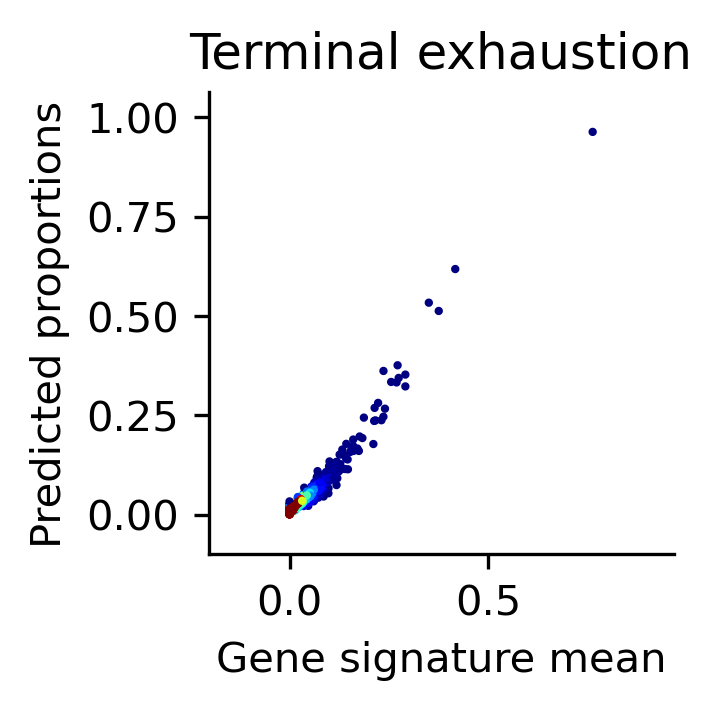

In [19]:
n_cell_types = gene_sig.shape[1]
idx = np.random.randint(0, n_cell_types)
post_analysis.gene_mean_vs_inferred_prop(inference_outputs,
                                         visium_args,
                                         idx=idx
                                        )

##### Spatial Visualisations
##### Inferred density on Spatial map

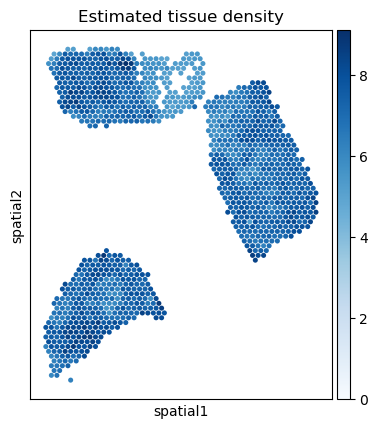

In [20]:
plot_utils.pl_spatial_inf_feature(adata, feature='ql_m', cmap='Blues')

##### Inferred cell-type proportions (spatial map)

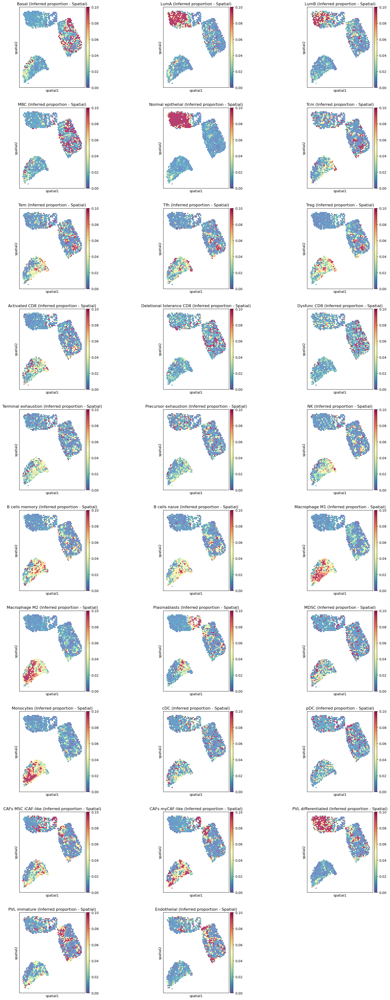

In [21]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qc_m',
                                  # To display for specific cell types:
                                  # factor = cell type or factor = [cell type1, ...]
                                  vmax=0.1)

##### Inferred cell-type proportions on Z-space (UMAP)

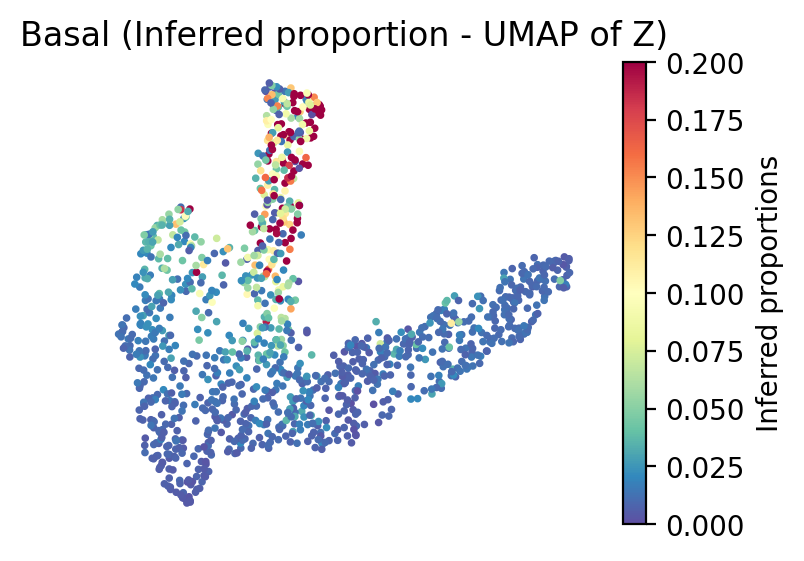

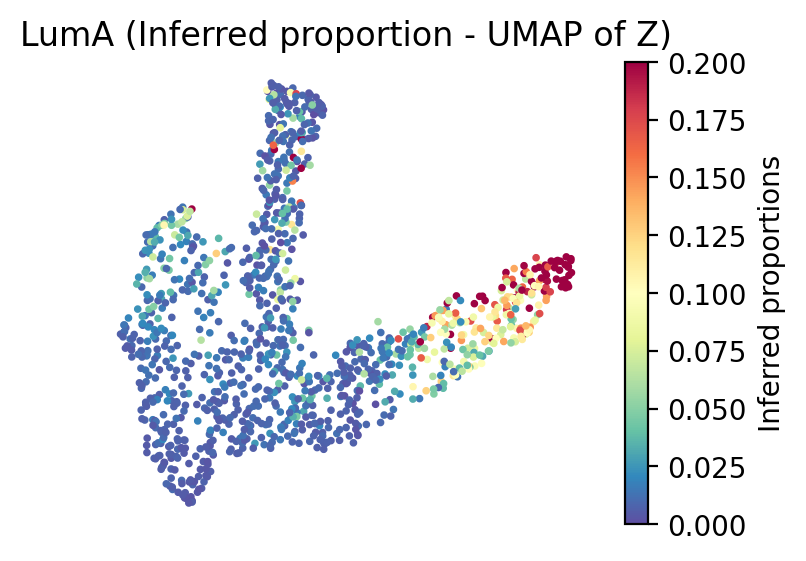

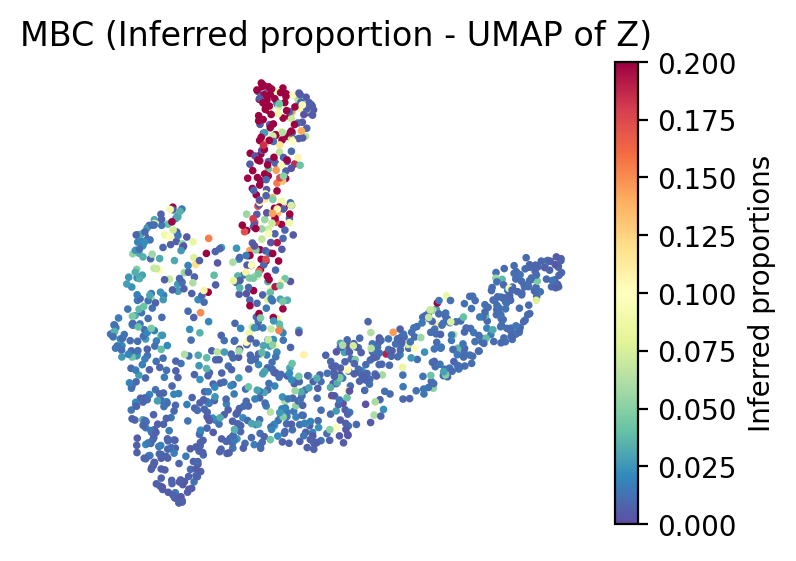

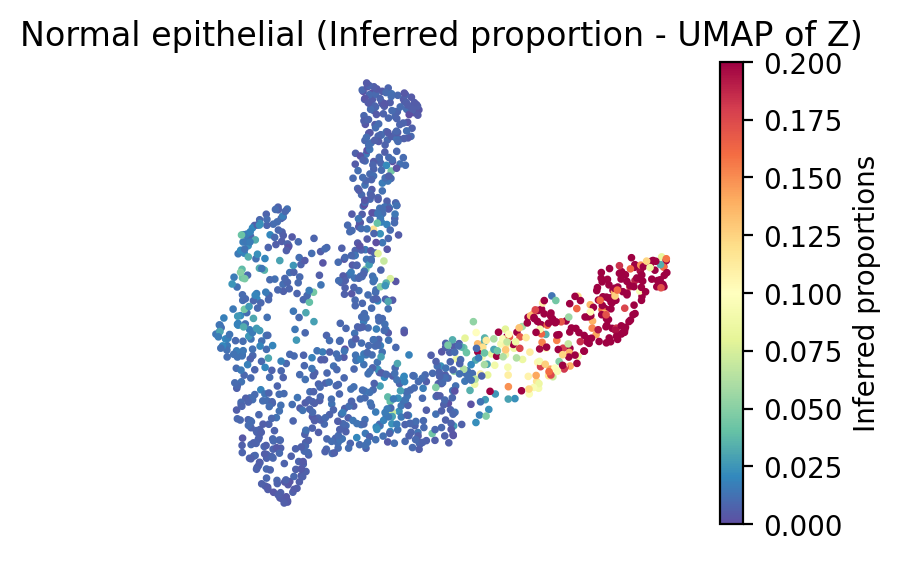

In [22]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qz_m',
                                  # To display for specific cell types:
                                  # factor = Cell type or factor = [Cell type1, ...]
                                  factor=['Basal', 'LumA', 'MBC', 'Normal epithelial'],
                                  spot_size=3,
                                  vmax=0.2)

##### Infer cell-type specific expressions from each spot

In [23]:
pred_exprs = sf_model.model_ct_exp(model,
                                   adata,
                                   visium_args,
                                   device=device)

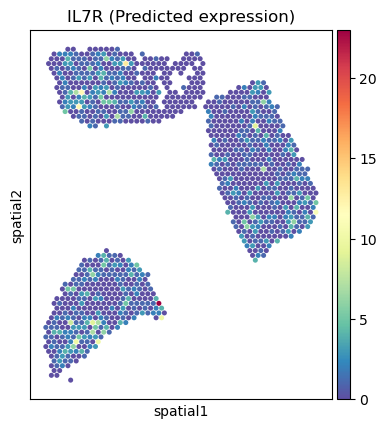

In [24]:
# Plot spot-level expression (e.g. IL7R from Effector Memory T cells (Tem))
sample_gene = 'IL7R'
sample_cell_type = 'Tem'

plot_utils.pl_spatial_inf_gene(adata,
                               factor=sample_cell_type,
                               feature=sample_gene)

#### Starfysh Deconvolution with Histology Integration

##### Parse Starfysh Inference outputs

In [25]:
inference_outputs_poe, generative_outputs_poe = sf_model.model_eval(model_hist,
                                                                    adata,
                                                                    visium_args,
                                                                    poe=True,
                                                                    device=device)

#### Visualize Starfysh deconvolution results
##### Gene signature mean vs inferred proportion

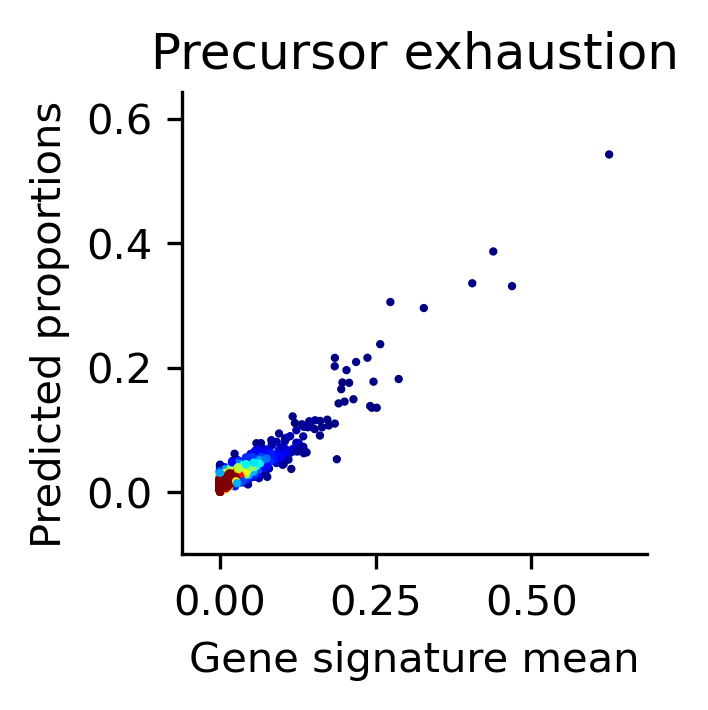

In [26]:
n_cell_types = gene_sig.shape[1]
idx = np.random.randint(0, n_cell_types)
post_analysis.gene_mean_vs_inferred_prop(inference_outputs_poe,
                                         visium_args,
                                         idx=idx
                                        )

##### Spatial visualisations

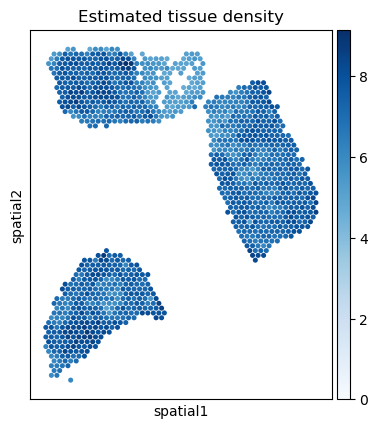

In [27]:
plot_utils.pl_spatial_inf_feature(adata, feature='ql_m', cmap='Blues')

##### Inferred cell-type proportions (spatial map)

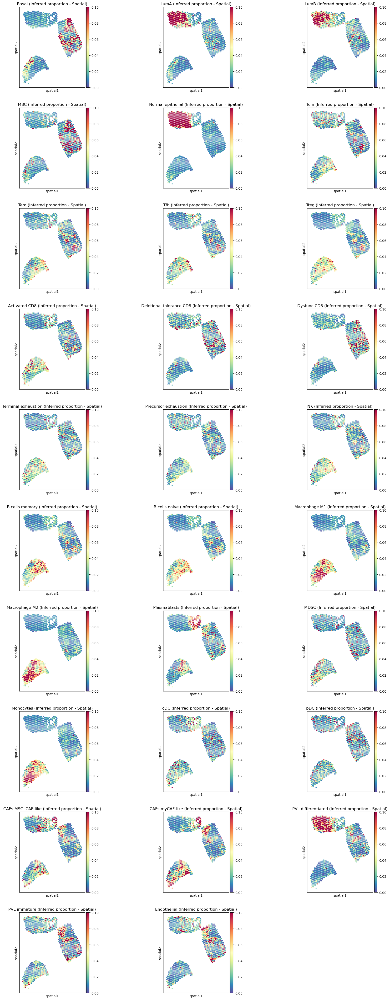

In [28]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qc_m',
                                  # To display for specific cell types:
                                  # factor = cell type or factor = [cell type1, ...]
                                  vmax=0.1)

##### Inferred cell-type proportions on Z-space (UMAP)

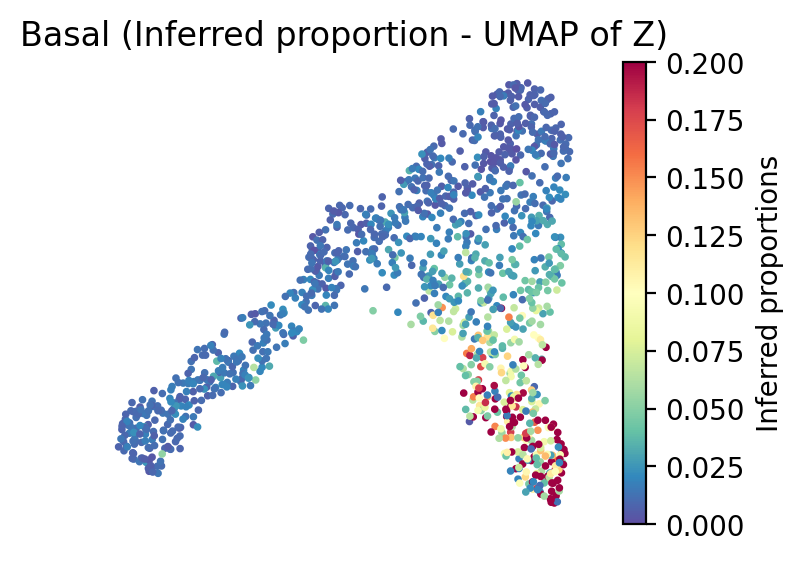

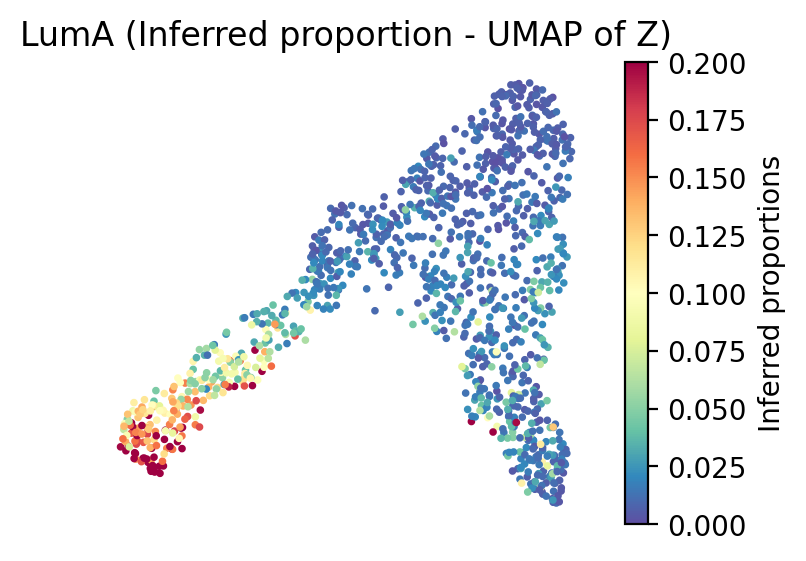

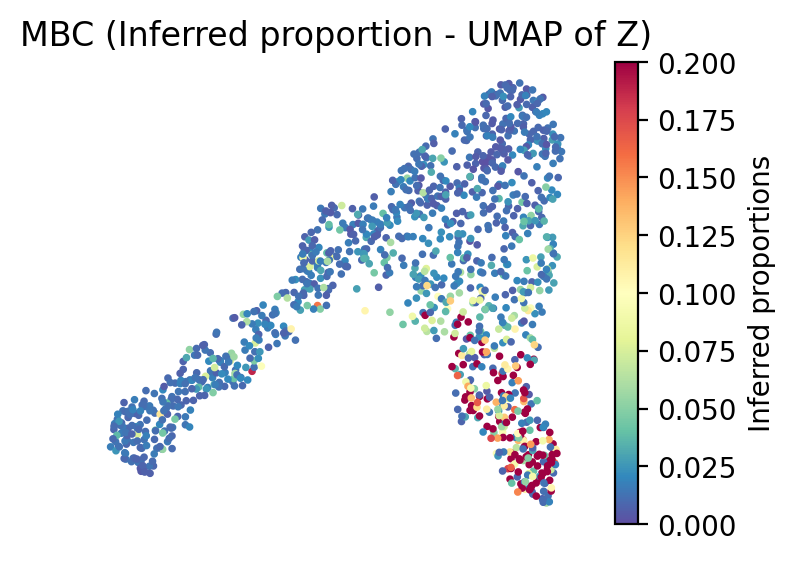

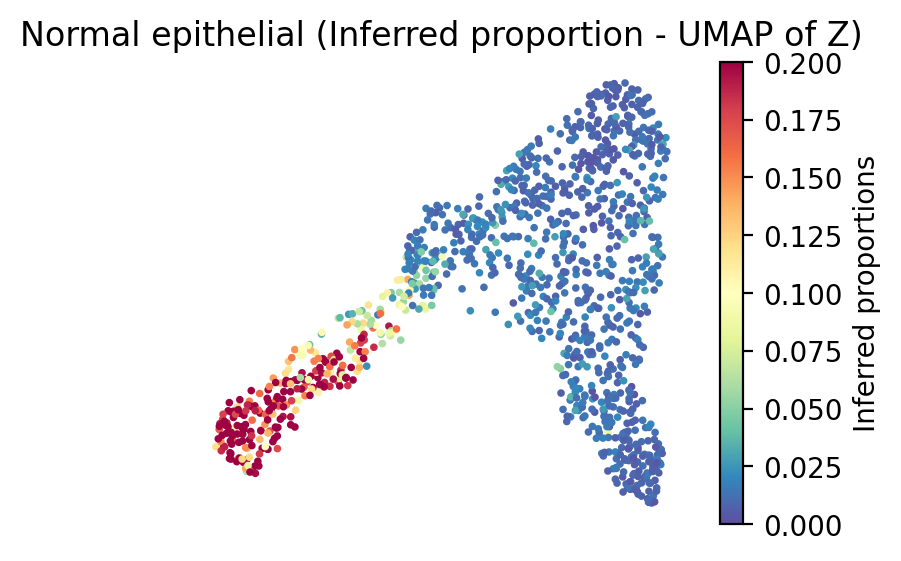

In [29]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qz_m',
                                  # To display for specific cell types:
                                  # factor = Cell type or factor = [Cell type1, ...]
                                  factor=['Basal', 'LumA', 'MBC', 'Normal epithelial'],
                                  vmax=0.2)

##### Infer cell-type specific expressions from each spot

In [30]:
pred_exprs = sf_model.model_ct_exp(model_hist,
                                   adata,
                                   visium_args,
                                   #poe=True,
                                   device=device)

In [31]:
#Plot spot-level expression (e.g. IL7R from Effector Memory T cells (Tem))
sample_gene = 'IL7R'
sample_cell_type = 'Tem'

plot_utils.pl_spatial_inf_gene(adata,
                               factor=sample_cell_type,
                               feature=sample_gene)

MemoryError: Unable to allocate 3.42 MiB for an array with shape (370, 303, 4) and data type float64

<Figure size 640x480 with 2 Axes>

#### Save model & inferred parameters

In [32]:
# Specify output directory
outdir = os.path.join(data_path, 'results')  # This creates a 'results' folder in the same directory as `data_path`
if not os.path.exists(outdir):
    os.mkdir(outdir)

# Save the base model
torch.save(model.state_dict(), os.path.join(outdir, 'starfysh_model_5_10.pt'))

# Save the PoE-trained model (model_hist)
torch.save(model_hist.state_dict(), os.path.join(outdir, 'starfysh_model_hist_5_10.pt'))

# Save `adata` object with inferred parameters
adata.write(os.path.join(outdir, 'st_5_10.h5ad'))

In [33]:
# Save results for both models
torch.save(model.state_dict(), os.path.join(outdir, 'base_model_5_10.pt'))
torch.save(model_hist.state_dict(), os.path.join(outdir, 'poe_model_5_10.pt'))

# Compare saved `adata` objects if differences are expected
adata.write(os.path.join(outdir, 'st_base_5_10.h5ad'))
adata.write(os.path.join(outdir, 'st_poe_5_10.h5ad'))